In [1]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from pathlib import Path
import numpy as np
import os
import sys
import glob
import pandas as pd
import xml.etree.ElementTree as et
import datetime
from skimage.io import imread, imsave
from skimage import io, segmentation, color
from imageio import volread as imread

import tifffile
import pystackreg
from pystackreg import StackReg
from skimage.filters import threshold_otsu

from pystackreg.util import to_uint16   # make sure version 0.2.5 (not anything below)
# from ims_to_tiff import convert_to_tif  
from tqdm.notebook import tqdm

import seaborn as sns
import pylab as pl

import copy

### Soma Segmentation Validation

In [6]:
### MAKE SURE TO HAVE THIS NOTEBOOK IN THE SAME DIRECTORY AS "Soma_Segmentation" WHICH HAS THE SOMA SEGMENTATIONS

soma_seg = glob.glob("Soma_Segmentation/*")

In [4]:
import operator as op
import statistics
df = pd.DataFrame()
df["count"] = 0
df["FOV"] = 0
df["Plate"] = 0

In [17]:
# test run on couple of images
soma_seg_ = iter(sorted(soma_seg))
for c in range(3):
    _soma_seg = next(soma_seg_) 
    soma_seg_0 = imread(_soma_seg)    
    uniqe = list(set(soma_seg_0.flatten()))[1:]

    df.loc[c, 'count'] = len(uniqe)
    df.loc[c, 'FOV'] = _soma_seg.split("/")[2][-18:-13]
    df.loc[c, 'Plate'] = _soma_seg.split("/")[2][:7]
    print(_soma_seg.split("/")[2][-18:-13])
    cell_area_list = []
    for i in uniqe:
        area = np.count_nonzero(soma_seg_0 == i)
        cell_area_list.append(area)
    df.loc[c, 'max_cell_area'] = max(cell_area_list)/(2048*2048)
    df.loc[c, 'min_cell_area'] = min(cell_area_list)/(2048*2048)
    df.loc[c, 'median_cell_area'] = statistics.median(cell_area_list)/(2048*2048)
    print(_soma_seg)
    

F0000
040524_HD_CellPaint_Stressors_msGlia_D14_Processed/Soma_Segmentation/Plate_1_F0000_cp_masks.tif
F0001
040524_HD_CellPaint_Stressors_msGlia_D14_Processed/Soma_Segmentation/Plate_1_F0001_cp_masks.tif
F0002
040524_HD_CellPaint_Stressors_msGlia_D14_Processed/Soma_Segmentation/Plate_1_F0002_cp_masks.tif


In [18]:
df

,count,FOV,Plate,max_cell_area,min_cell_area,median_cell_area
0,37.0,F0000,Plate_1,0.002114,0.000110,0.001006
1,43.0,F0001,Plate_1,0.001394,0.000228,0.000903
2,22.0,F0002,Plate_1,0.001506,0.000209,0.000929


In [19]:
soma_seg_ = iter(sorted(soma_seg))
for c in range(3000):
    _soma_seg = next(soma_seg_) 
    soma_seg_0 = imread(_soma_seg)    
    uniqe = list(set(soma_seg_0.flatten()))[1:]

    df.loc[c, 'count'] = len(uniqe)
    df.loc[c, 'FOV'] = _soma_seg.split("/")[2][-18:-13]
    df.loc[c, 'Plate'] = _soma_seg.split("/")[2][:7]
    print(_soma_seg.split("/")[2][-18:-13])
    cell_area_list = []
    for i in uniqe:
        area = np.count_nonzero(soma_seg_0 == i)
        cell_area_list.append(area)
    print(_soma_seg)
    for i in res_wo_0:
        area = np.count_nonzero(soma_seg_0 == i)
        cell_area_list.append(area)
    try:
        df.loc[c, 'total_cell_area'] = sum(cell_area_list)
        print(sum(cell_area_list))
    except:
        continue
    try:
        df.loc[c, 'max_cell_area'] = max(cell_area_list)/(2048*2048)
    except:
        continue
    try:
        df.loc[c, 'min_cell_area'] = min(cell_area_list)/(2048*2048)
    except:
        continue
    df.loc[c, 'median_cell_area'] = statistics.median(cell_area_list)/(2048*2048)
    print(_soma_seg)

df.to_csv("output/cell_count_per_FOV.csv")    

F0000
040524_HD_CellPaint_Stressors_msGlia_D14_Processed/Soma_Segmentation/Plate_1_F0000_cp_masks.tif
256144
040524_HD_CellPaint_Stressors_msGlia_D14_Processed/Soma_Segmentation/Plate_1_F0000_cp_masks.tif
F0001
040524_HD_CellPaint_Stressors_msGlia_D14_Processed/Soma_Segmentation/Plate_1_F0001_cp_masks.tif
245221
040524_HD_CellPaint_Stressors_msGlia_D14_Processed/Soma_Segmentation/Plate_1_F0001_cp_masks.tif
F0002
040524_HD_CellPaint_Stressors_msGlia_D14_Processed/Soma_Segmentation/Plate_1_F0002_cp_masks.tif
170290
040524_HD_CellPaint_Stressors_msGlia_D14_Processed/Soma_Segmentation/Plate_1_F0002_cp_masks.tif


(array([  0.,   0.,   0.,   1.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,
          0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,
          0.,   0.,   0.,   0.,   0.,   0.,   0.,   1.,   1.,   2.,   1.,
         10.,  24.,  30.,  35.,  73.,  96., 120., 151., 148., 146., 157.,
        165., 176., 146., 141., 130., 126., 106., 109.,  81.,  81.,  62.,
         89.,  52.,  51.,  36.,  50.,  37.,  49.,  29.,  30.,  27.,  28.,
         20.,  26.,  14.,  12.,  14.,  11.,  13.,   7.,   5.,  13.,   7.,
          8.,   8.,   5.,   4.,   4.,   2.,   1.,   3.,   3.,   3.,   1.,
          1.,   2.,   1.,   1.,   1.,   0.,   0.,   2.,   0.,   1.,   0.,
          0.,   1.,   1.,   2.,   0.,   1.,   0.,   0.,   0.,   0.,   0.,
          0.,   0.,   0.,   0.,   1.,   0.,   0.,   0.,   0.,   1.,   0.,
          0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,
          0.,   0.,   0.,   0.,   0.,   0.,   0.,   1.,   0.,   0.,   0.,
          0.,   0.,   0.,   0.,   0., 

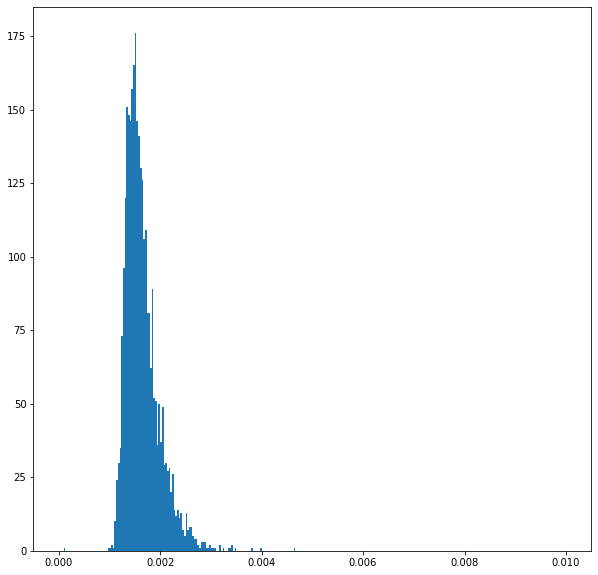

In [8]:
cell_count = pd.read_csv("output/cell_count_per_FOV.csv")
plt.figure(figsize = (10,10))
plt.hist(cell_count["max_cell_area"], range=(-0, 0.01), bins=300)

In [39]:
list(cell_count['max_cell_area'])

[0.002114295959472656,
 0.001394033432006836,
 0.001506328582763672,
 0.0019528865814208984,
 0.001451730728149414,
 0.0012187957763671875,
 0.0016200542449951172,
 0.0026040077209472656,
 0.001353740692138672,
 0.0020716190338134766,
 0.003376007080078125,
 0.001234292984008789,
 0.0016596317291259766,
 0.0022559165954589844,
 0.00176239013671875,
 0.0016241073608398438,
 0.002240180969238281,
 0.001664876937866211,
 0.00399470329284668,
 0.0021696090698242188,
 0.0015306472778320312,
 0.003088474273681641,
 0.0020575523376464844,
 0.0017333030700683596,
 0.002819061279296875,
 0.0020842552185058594,
 0.001507282257080078,
 0.0022628307342529297,
 0.002265453338623047,
 0.0019614696502685547,
 0.0016012191772460938,
 0.001697540283203125,
 0.0014264583587646484,
 0.0020492076873779297,
 0.002056121826171875,
 0.0020241737365722656,
 0.0015914440155029295,
 0.0015475749969482422,
 0.0013570785522460938,
 0.0017211437225341795,
 0.002180337905883789,
 0.001550436019897461,
 0.0016713142

In [44]:
sorted(list(cell_count['max_cell_area']))[-10:]

[0.003169536590576172,
 0.0031719207763671875,
 0.003255128860473633,
 0.0033664703369140625,
 0.0034036636352539067,
 0.003432750701904297,
 0.0034809112548828125,
 0.0038247108459472656,
 0.004654645919799805,
 0.9824676513671876]

In [47]:
for idx in range(3000):
    if cell_count['max_cell_area'][idx] == 0.9824676513671876:
        print(idx)

1728


In [49]:
print(cell_count.loc[[1728]])

      Unnamed: 0  count    FOV    Plate  total_cell_area  max_cell_area  \
1728        1728   21.0  F0228  Plate_2        4192003.0       0.982468   

      min_cell_area  median_cell_area  
1728       0.000222           0.00092  


In [50]:
np.quantile(cell_count["total_cell_area"], 0.99)

384998.0999999998

In [9]:
def find_cell_boundaries(image_path, mask_path):
    image = io.imread(image_path)[0, ...]   # 0 for RNA, 1 for DNA -- also depends on the data 
    labels = io.imread(mask_path)

    # Find boundaries
    boundaries = segmentation.find_boundaries(labels, mode='thick')
    
    overlay = (boundaries*255 + image/150)/2   # toggle the 255 and 150 depending on the image intensities

    # Display the original and boundary images
    fig, ax = plt.subplots(1, 2, figsize=(20, 20))
    ax[0].imshow(image, cmap='gray')
    ax[0].set_title('Original Image')
    ax[0].axis('off')

    ax[1].imshow(overlay)
    ax[1].set_title('Overlay')
    ax[1].axis('off')

    plt.show()


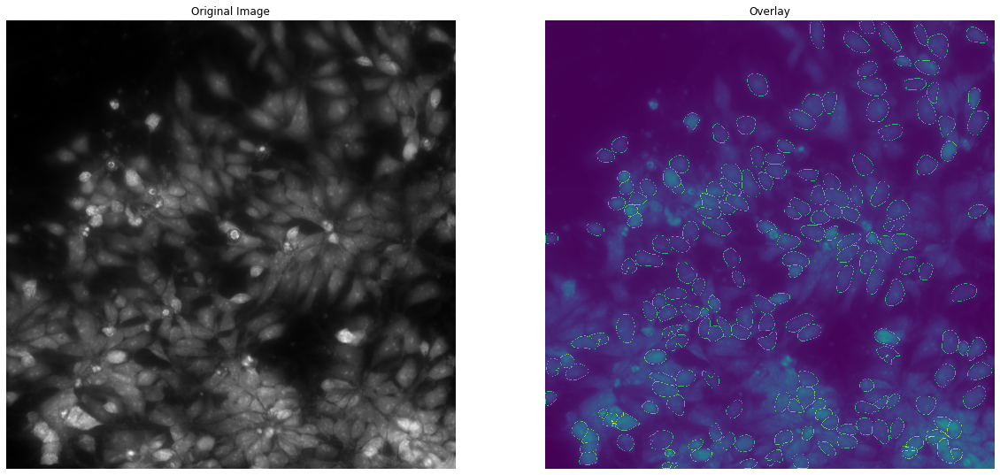

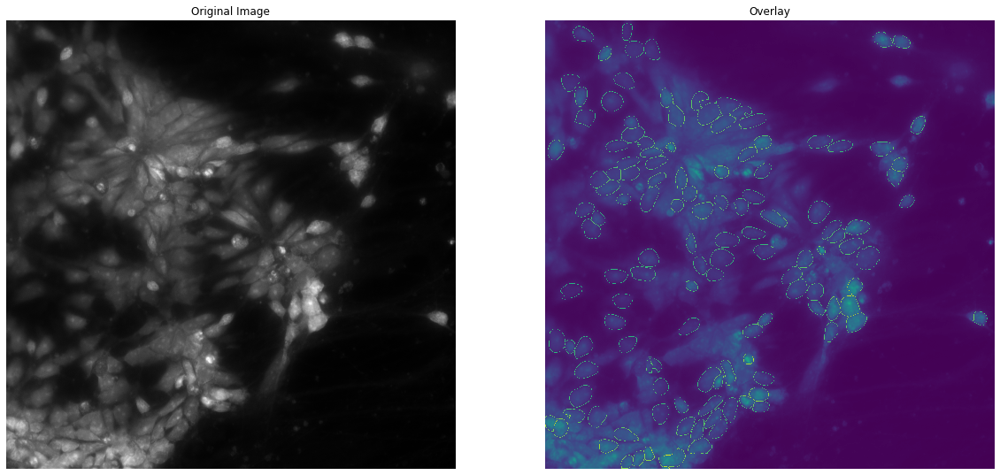

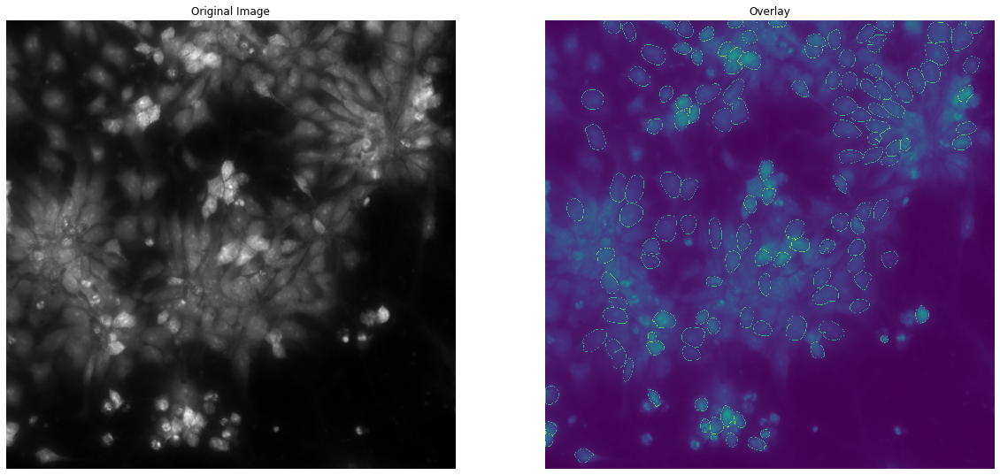

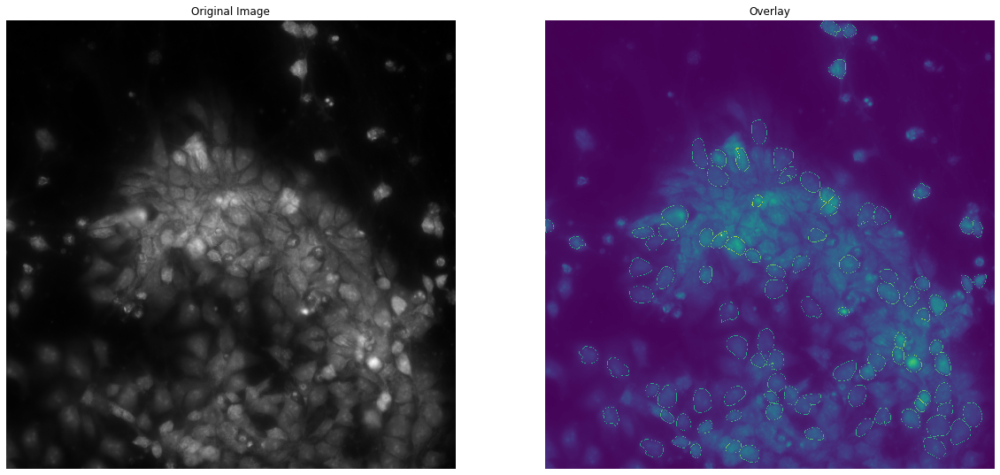

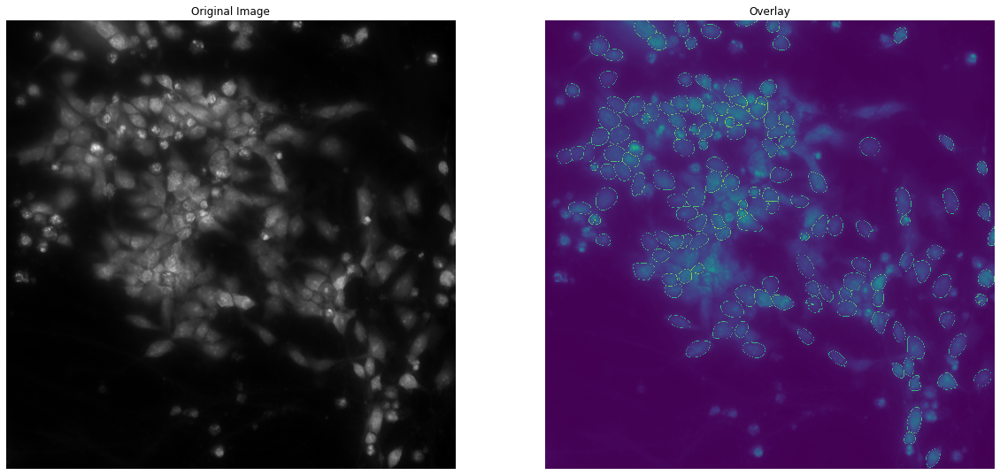

...

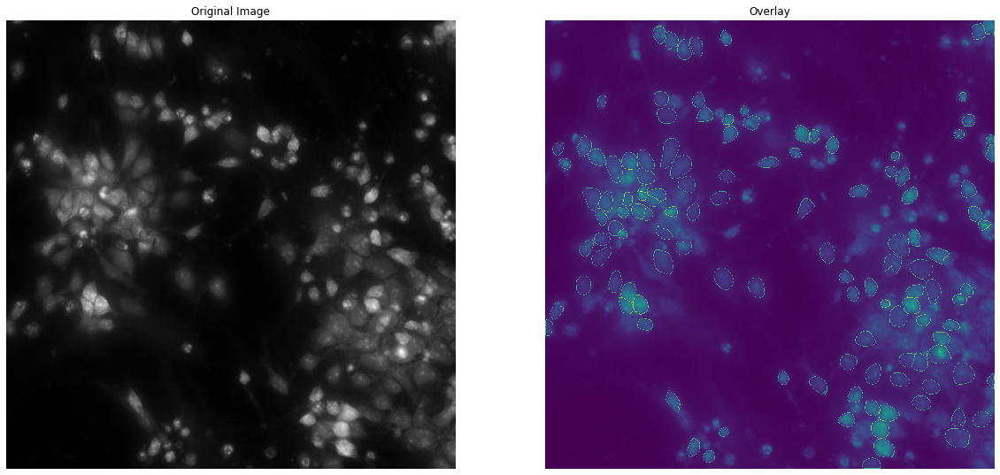

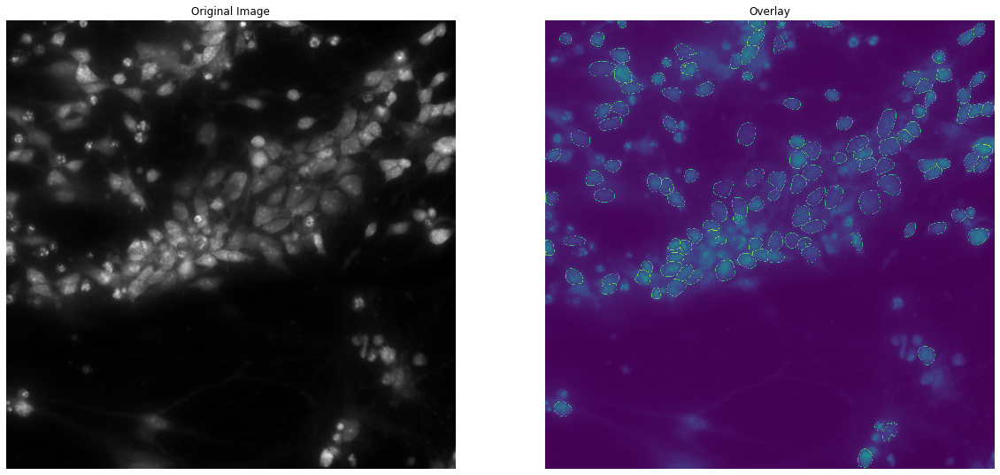

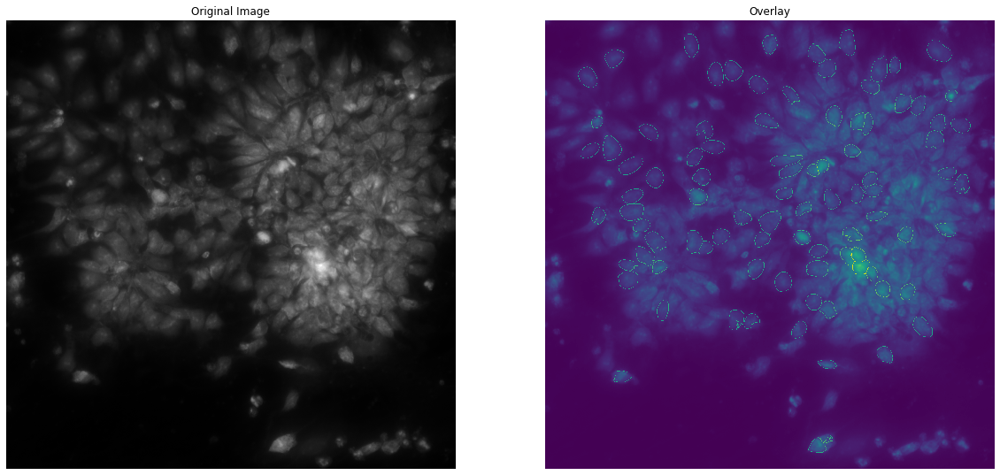

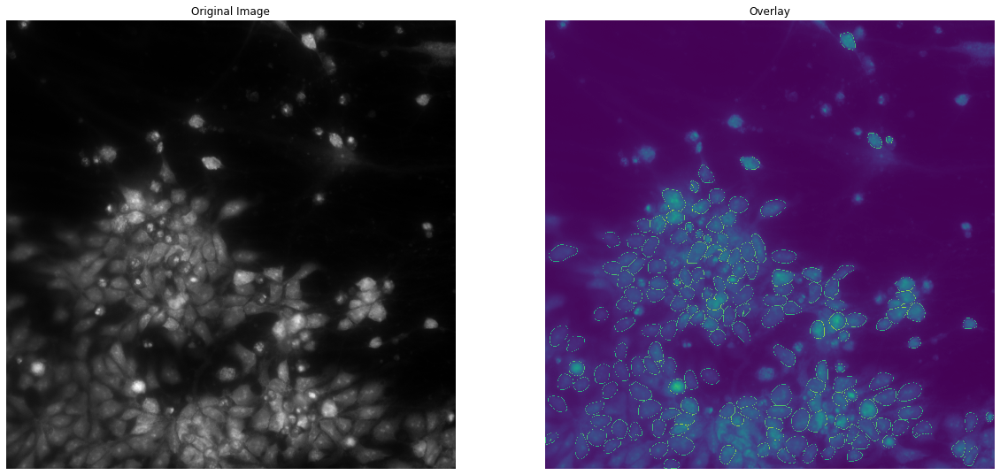

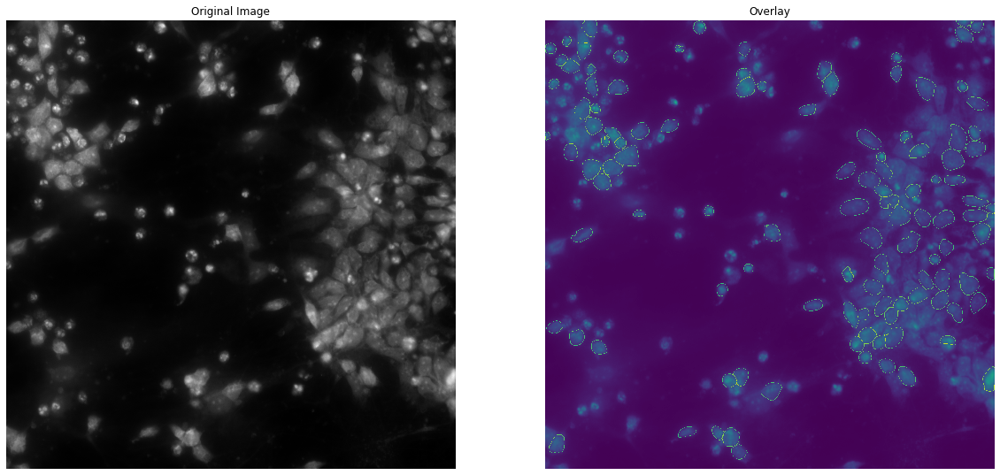

In [10]:
image_dir_name = "images_2_channel"
mask_dir_name = "Soma_Segmentation"
for idx, val in enumerate((cell_count["total_cell_area"])):
#     print(idx, val)
    plate = cell_count["Plate"][idx]
    fov = cell_count["FOV"][idx]
    if val > np.quantile(cell_count["total_cell_area"], 0.99):
        find_cell_boundaries(f"{image_dir_name}/{plate}_{fov}.tif", f"{mask_dir_name}/{plate}_{fov}_cp_masks.tif")
